In [1]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
gunavenkatdoddi_eye_diseases_classification_path = kagglehub.dataset_download('gunavenkatdoddi/eye-diseases-classification')

print('Data source import complete.')


100%|███████████████████████████████████████████████████████████████████████████████| 736M/736M [03:32<00:00, 3.62MB/s]

Extracting files...


Data source import complete.


In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files undeAr the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [17]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report 
import joblib
import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

modules loaded


In [18]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("gunavenkatdoddi/eye-diseases-classification")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\pulak\.cache\kagglehub\datasets\gunavenkatdoddi\eye-diseases-classification\versions\1


In [19]:
data_dir= 'C:/Users/pulak/.cache/kagglehub/datasets/gunavenkatdoddi/eye-diseases-classification/versions/1/dataset'
filepath=[]
labels=[]
folds=os.listdir(data_dir)
for fold in folds:
    filpath=os.path.join(data_dir,fold)
    filelist=os.listdir(filpath)
    for f in filelist:
        fpath=os.path.join(filpath,f)
        filepath.append(fpath)
        labels.append(fold)
f_series=pd.Series(filepath,name='filepath') 
l_series=pd.Series(labels,name='labels')
df=pd.concat([f_series,l_series],axis=1)

In [20]:
df

,filepath,labels
0,C:/Users/pulak/.cache/kagglehub/datasets/gunav...,cataract
1,C:/Users/pulak/.cache/kagglehub/datasets/gunav...,cataract
2,C:/Users/pulak/.cache/kagglehub/datasets/gunav...,cataract
3,C:/Users/pulak/.cache/kagglehub/datasets/gunav...,cataract
4,C:/Users/pulak/.cache/kagglehub/datasets/gunav...,cataract
...,...,...
4212,C:/Users/pulak/.cache/kagglehub/datasets/gunav...,normal
4213,C:/Users/pulak/.cache/kagglehub/datasets/gunav...,normal
4214,C:/Users/pulak/.cache/kagglehub/datasets/gunav...,normal
4215,C:/Users/pulak/.cache/kagglehub/datasets/gunav...,normal


In [21]:
strat=df['labels']
train_df,dummy_df=train_test_split(df,test_size=0.3,random_state=42,stratify=strat)
strate=dummy_df['labels']
valid_df,test_df=train_test_split(dummy_df,test_size=0.5,random_state=42,stratify=strate)

print(train_df.shape)
print(valid_df.shape)
print(test_df.shape)


(2951, 2)
(633, 2)
(633, 2)


In [22]:
count_train=train_df['labels'].value_counts().reset_index()
count_train.columns=['label','count']
fig=px.bar(count_train,x='label',y='count',title='count of train_df',text_auto=True)
fig.show()

In [22]:
count_test=test_df['labels'].value_counts().reset_index()
count_test.columns=['label','count']
fig=px.bar(count_test,x='label',y='count',title='count of test_df',text_auto=True)
fig.show()

In [24]:
count_valid=valid_df['labels'].value_counts().reset_index()
count_valid.columns=['label','count']
fig=px.bar(count_valid,x='label',y='count',title='count of valid_df',text_auto=True)
fig.show()

In [23]:
batch_size = 32
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)
tr_gen = ImageDataGenerator()
ts_gen = ImageDataGenerator()

train_gen = tr_gen.flow_from_dataframe(train_df, x_col= 'filepath', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

valid_gen = ts_gen.flow_from_dataframe(valid_df, x_col= 'filepath', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                        color_mode= 'rgb', shuffle= True, batch_size= batch_size)

test_gen = ts_gen.flow_from_dataframe(test_df, x_col= 'filepath', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= False, batch_size= batch_size)

Found 2951 validated image filenames belonging to 4 classes.
Found 633 validated image filenames belonging to 4 classes.
Found 633 validated image filenames belonging to 4 classes.


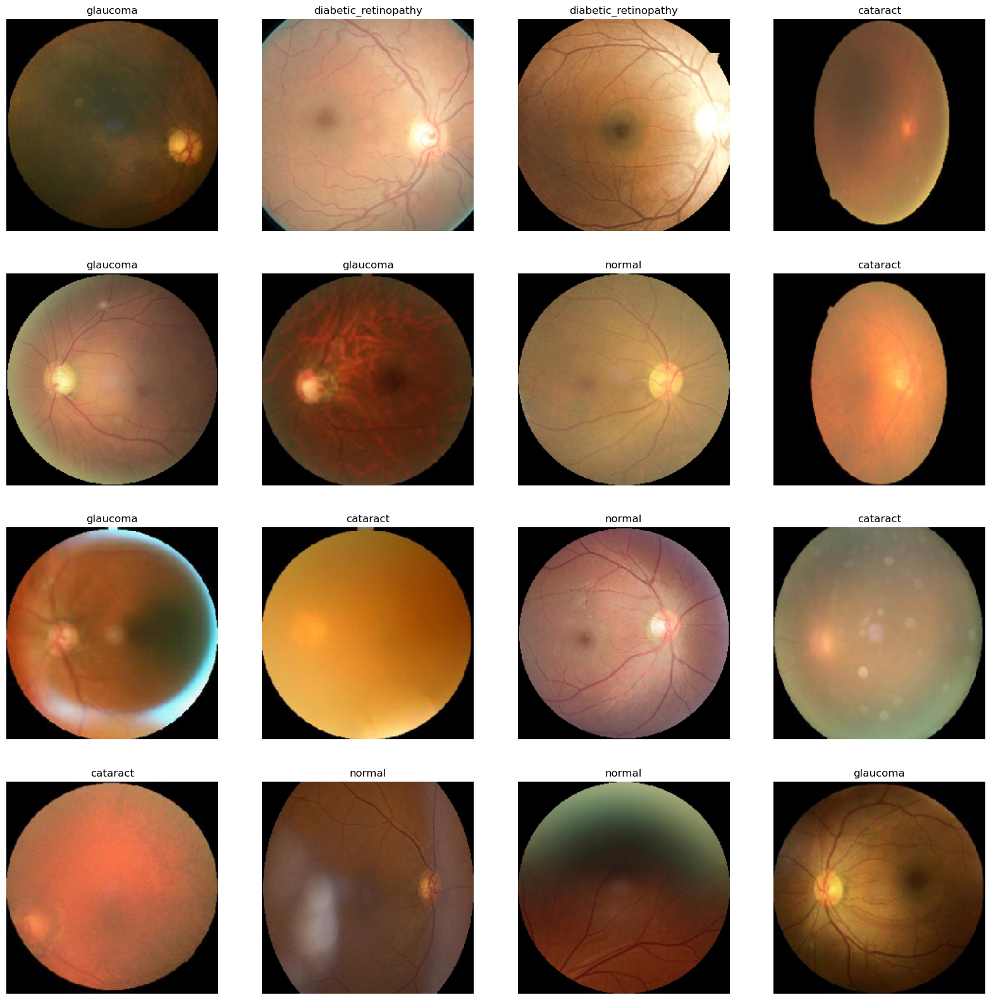

In [24]:
g_dict = train_gen.class_indices    
classes = list(g_dict.keys())      
images, labels = next(train_gen)     

plt.figure(figsize= (20, 20))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i] / 255      
    plt.imshow(image)
    index = np.argmax(labels[i])  
    class_name = classes[index]   
    plt.title(class_name, color= 'black', fontsize= 12)
    plt.axis('off')
plt.show()

In [25]:
from tensorflow.keras.applications import EfficientNetB3, DenseNet201
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adamax

# EfficientNetB3 Model
efficientnet_base = EfficientNetB3(include_top=False, weights="imagenet", input_shape=(224, 224, 3))
efficientnet_model = Sequential([
    efficientnet_base,
    Flatten(),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(4, activation='softmax')  # Adjust according to your class count
])

# Compile EfficientNetB3 Model
efficientnet_model.compile(optimizer=Adamax(learning_rate=0.001), 
                           loss='categorical_crossentropy', 
                           metrics=['accuracy'])

# DenseNet201 Model
densenet_base = DenseNet201(include_top=False, weights="imagenet", input_shape=(224, 224, 3))
densenet_model = Sequential([
    densenet_base,
    Flatten(),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(4, activation='softmax')  # Adjust according to your class count
])

# Compile DenseNet201 Model
densenet_model.compile(optimizer=Adamax(learning_rate=0.001), 
                       loss='categorical_crossentropy', 
                       metrics=['accuracy'])

# Model summaries to confirm structure
efficientnet_model.summary()
densenet_model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)          │ (None, 7, 7, 1536)          │      10,783,535 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 75264)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 256)                 │      19,267,840 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,084,787 (114.76 MB)

 Trainable params: 29,997,484 (114.43 MB)

 Non-trainable params: 87,303 (341.03 KB)

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ densenet201 (Functional)             │ (None, 7, 7, 1920)          │      18,321,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 94080)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 256)                 │      24,084,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 42,440,132 (161.90 MB)

 Trainable params: 42,211,076 (161.02 MB)

 Non-trainable params: 229,056 (894.75 KB)

In [27]:
# Train EfficientNetB3 model
efficientnet_history= efficientnet_model.fit(train_gen, validation_data=valid_gen, epochs=10)


Epoch 1/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 751s 7s/step - accuracy: 0.7129 - loss: 1.0927 - val_accuracy: 0.8626 - val_loss: 0.3882
Epoch 2/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 680s 7s/step - accuracy: 0.9408 - loss: 0.1562 - val_accuracy: 0.9289 - val_loss: 0.2571
Epoch 3/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 675s 7s/step - accuracy: 0.9601 - loss: 0.1029 - val_accuracy: 0.9336 - val_loss: 0.2572
Epoch 4/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 643s 7s/step - accuracy: 0.9865 - loss: 0.0381 - val_accuracy: 0.9242 - val_loss: 0.3124
Epoch 5/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 682s 7s/step - accuracy: 0.9883 - loss: 0.0392 - val_accuracy: 0.9384 - val_loss: 0.2967
Epoch 6/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 642s 7s/step - accuracy: 0.9858 - loss: 0.0379 - val_accuracy: 0.9210 - val_loss: 0.2749
Epoch 7/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 665s 7s/step - accuracy: 0.9930 - loss: 0.0243 - val_accuracy: 0.9305 - val_loss: 0.3067
Epoch 8/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 658s 7s/step - accuracy: 0.9920 - loss: 0.0206 - val_accuracy: 0.9352 - v

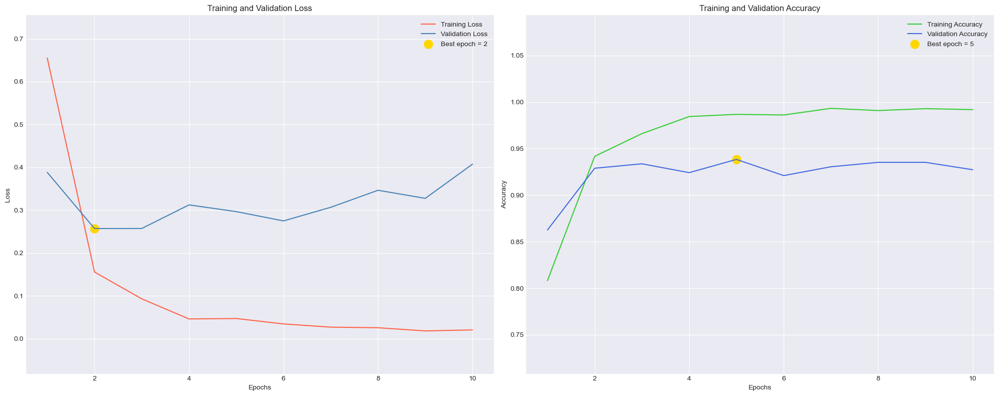

In [28]:
import numpy as np
import matplotlib.pyplot as plt

# Access the history object
history = efficientnet_history  # Replace with the variable holding your model's history object

# Extract accuracy and loss values
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

# Find the best epoch for loss and accuracy
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i + 1 for i in range(len(tr_acc))]
loss_label = f'Best epoch = {index_loss + 1}'
acc_label = f'Best epoch = {index_acc + 1}'

# Plotting with a customized style and colors
plt.figure(figsize=(20, 8))
plt.style.use('seaborn-darkgrid')  # Change style

# Determine y-axis limits for more balanced graphs
loss_ylim = [min(min(tr_loss), min(val_loss)) - 0.1, max(max(tr_loss), max(val_loss)) + 0.1]
acc_ylim = [min(min(tr_acc), min(val_acc)) - 0.1, max(max(tr_acc), max(val_acc)) + 0.1]

# Plot Loss with new colors
plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, color='#FF6347', label='Training Loss')  # Tomato color for training loss
plt.plot(Epochs, val_loss, color='#4682B4', label='Validation Loss')  # Steel blue color for validation loss
plt.scatter(index_loss + 1, val_lowest, s=150, color='#FFD700', label=loss_label)  # Gold color for best epoch
plt.ylim(loss_ylim)  # Set y-axis limits
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy with new colors
plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, color='#32CD32', label='Training Accuracy')  # Lime green color for training accuracy
plt.plot(Epochs, val_acc, color='#4169E1', label='Validation Accuracy')  # Royal blue color for validation accuracy
plt.scatter(index_acc + 1, acc_highest, s=150, color='#FFD700', label=acc_label)  # Gold color for best epoch
plt.ylim(acc_ylim)  # Set y-axis limits
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

211/211 ━━━━━━━━━━━━━━━━━━━━ 115s 541ms/step - accuracy: 0.9988 - loss: 0.0029
211/211 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - accuracy: 0.9284 - loss: 0.2629
211/211 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - accuracy: 0.9131 - loss: 0.4030
Train Loss:  0.0024869025219231844
Train Accuracy:  0.9989833831787109
--------------------
Valid Loss:  0.26679134368896484
Valid Accuracy:  0.928909957408905
--------------------
Test Loss:  0.4132225811481476
Test Accuracy:  0.9115324020385742
20/20 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step


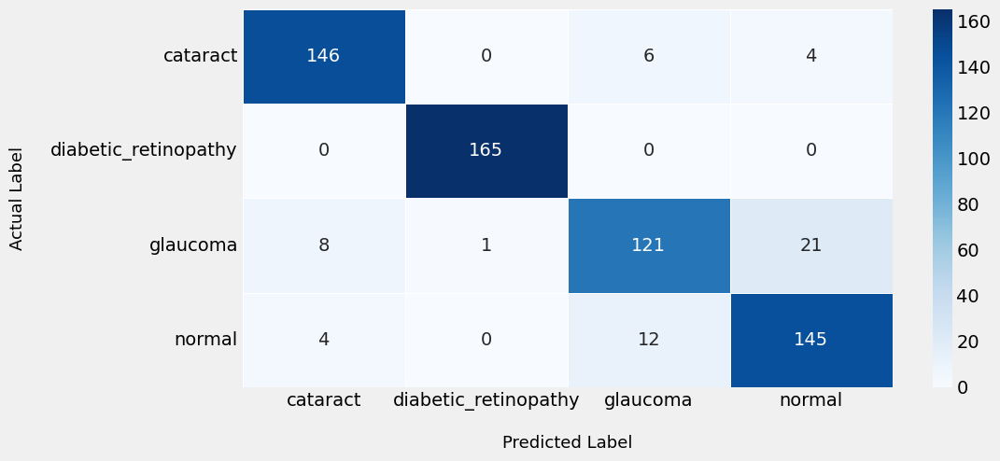

                      precision    recall  f1-score   support

            cataract       0.92      0.94      0.93       156
diabetic_retinopathy       0.99      1.00      1.00       165
            glaucoma       0.87      0.80      0.83       151
              normal       0.85      0.90      0.88       161

            accuracy                           0.91       633
           macro avg       0.91      0.91      0.91       633
        weighted avg       0.91      0.91      0.91       633



['eye_disease_classification11.pkl']

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import joblib

# Set test batch size and steps
ts_length = len(test_df)
test_batch_size = max([ts_length // n for n in range(1, ts_length + 1) if ts_length % n == 0 and ts_length / n <= 80])
test_steps = ts_length // test_batch_size

# Evaluate the model on Train, Validation, and Test sets
train_score = efficientnet_model.evaluate(train_gen, steps=test_steps, verbose=1)
valid_score = efficientnet_model.evaluate(valid_gen, steps=test_steps, verbose=1)
test_score = efficientnet_model.evaluate(test_gen, steps=test_steps, verbose=1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Valid Loss: ", valid_score[0])
print("Valid Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

# Predictions on test data
preds = efficientnet_model.predict(test_gen)
y_pred = np.argmax(preds, axis=1)

# Confusion Matrix
plt.figure(figsize=(10, 5))
cm = confusion_matrix(test_gen.classes, y_pred)
labels = list(test_gen.class_indices.keys())
sns.heatmap(cm, annot=True, fmt="d", xticklabels=labels, yticklabels=labels, cmap="Blues", linewidths=.5)
plt.xlabel('\nPredicted Label', fontsize=13)
plt.ylabel('Actual Label\n', fontsize=13)
plt.show()

# Classification Report
print(classification_report(test_gen.classes, y_pred, target_names=labels))

# Save the trained model to a .pkl file
joblib.dump(efficientnet_model, "eye_disease_classification11.pkl")


In [50]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adamax
import numpy as np

# Define DenseNet201 Model
densenet_base = DenseNet201(include_top=False, weights="imagenet", input_shape=(224, 224, 3))
densenet_model = Sequential([
    densenet_base,
    Flatten(),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(4, activation='softmax')  # Adjust for your number of classes
])
densenet_model.compile(optimizer=Adamax(learning_rate=0.001), 
                       loss='categorical_crossentropy', 
                       metrics=['accuracy'])

# Build the model by calling it on a sample input
densenet_model(np.zeros((1, 224, 224, 3)))  # Replace (224, 224, 3) if your input shape differs

# Train DenseNet201 model
densenet_history = densenet_model.fit(train_gen, validation_data=valid_gen, epochs=10)

# Continue with evaluation and prediction steps


Epoch 1/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 1361s 13s/step - accuracy: 0.6396 - loss: 3.4682 - val_accuracy: 0.8689 - val_loss: 1.1320
Epoch 2/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 1142s 12s/step - accuracy: 0.9060 - loss: 0.2559 - val_accuracy: 0.8910 - val_loss: 0.4096
Epoch 3/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 1125s 12s/step - accuracy: 0.9518 - loss: 0.1393 - val_accuracy: 0.9163 - val_loss: 0.2790
Epoch 4/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 1184s 13s/step - accuracy: 0.9751 - loss: 0.0833 - val_accuracy: 0.8863 - val_loss: 0.4137
Epoch 5/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 1159s 12s/step - accuracy: 0.9787 - loss: 0.0696 - val_accuracy: 0.9084 - val_loss: 0.3085
Epoch 6/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 1163s 12s/step - accuracy: 0.9697 - loss: 0.0869 - val_accuracy: 0.9273 - val_loss: 0.3057
Epoch 7/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 1192s 13s/step - accuracy: 0.9814 - loss: 0.0609 - val_accuracy: 0.9179 - val_loss: 0.4957
Epoch 8/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 1143s 12s/step - accuracy: 0.9761 - loss: 0.0738 - val_accu

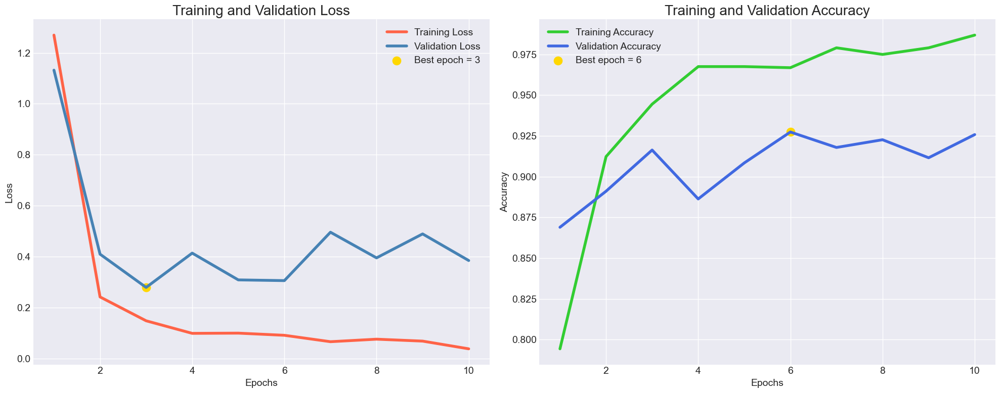

In [51]:
# Access the history object
history = densenet_history  # Replace with the variable holding your model's history object

# Extract accuracy and loss values
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

# Find the best epoch for loss and accuracy
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i + 1 for i in range(len(tr_acc))]
loss_label = f'Best epoch = {index_loss + 1}'
acc_label = f'Best epoch = {index_acc + 1}'

# Plotting with a customized style and colors
plt.figure(figsize=(20, 8))
plt.style.use('seaborn-darkgrid')  # Change style

# Plot Loss with new colors
plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, color='#FF6347', label='Training Loss')  # Tomato color for training loss
plt.plot(Epochs, val_loss, color='#4682B4', label='Validation Loss')  # Steel blue color for validation loss
plt.scatter(index_loss + 1, val_lowest, s=150, color='#FFD700', label=loss_label)  # Gold color for best epoch
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy with new colors
plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, color='#32CD32', label='Training Accuracy')  # Lime green color for training accuracy
plt.plot(Epochs, val_acc, color='#4169E1', label='Validation Accuracy')  # Royal blue color for validation accuracy
plt.scatter(index_acc + 1, acc_highest, s=150, color='#FFD700', label=acc_label)  # Gold color for best epoch
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


211/211 ━━━━━━━━━━━━━━━━━━━━ 260s 1s/step - accuracy: 0.9884 - loss: 0.0455
211/211 ━━━━━━━━━━━━━━━━━━━━ 56s 254ms/step - accuracy: 0.9238 - loss: 0.3662
211/211 ━━━━━━━━━━━━━━━━━━━━ 56s 254ms/step - accuracy: 0.9094 - loss: 0.4920
Train Loss:  0.039912138134241104
Train Accuracy:  0.9891562461853027
--------------------
Valid Loss:  0.36919504404067993
Valid Accuracy:  0.9241706132888794
--------------------
Test Loss:  0.49772125482559204
Test Accuracy:  0.9083728194236755
20/20 ━━━━━━━━━━━━━━━━━━━━ 75s 3s/step


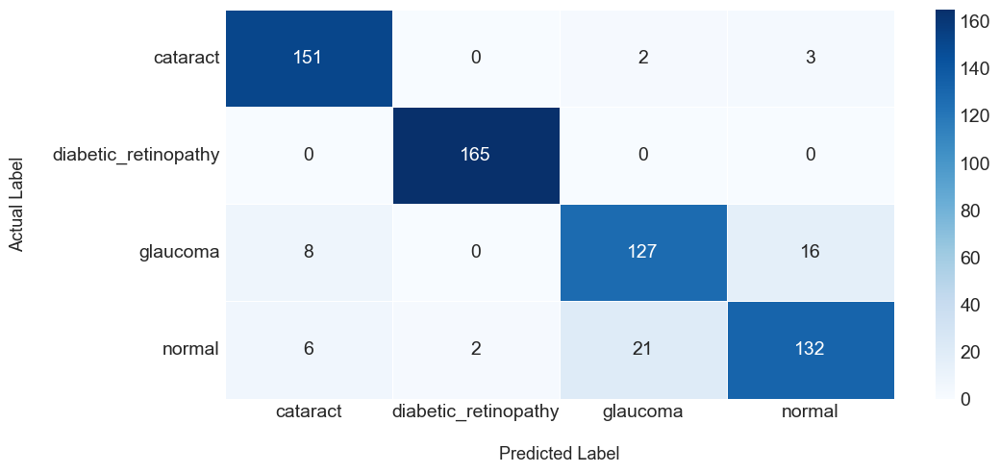

                      precision    recall  f1-score   support

            cataract       0.92      0.97      0.94       156
diabetic_retinopathy       0.99      1.00      0.99       165
            glaucoma       0.85      0.84      0.84       151
              normal       0.87      0.82      0.85       161

            accuracy                           0.91       633
           macro avg       0.91      0.91      0.91       633
        weighted avg       0.91      0.91      0.91       633



['densenet_eye_disease_classification.pkl']

In [53]:

# Set test batch size and steps
ts_length = len(test_df)
test_batch_size = max([ts_length // n for n in range(1, ts_length + 1) if ts_length % n == 0 and ts_length / n <= 80])
test_steps = ts_length // test_batch_size

# Evaluate DenseNet201 on Train, Validation, and Test sets
train_score = densenet_model.evaluate(train_gen, steps=test_steps, verbose=1)
valid_score = densenet_model.evaluate(valid_gen, steps=test_steps, verbose=1)
test_score = densenet_model.evaluate(test_gen, steps=test_steps, verbose=1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Valid Loss: ", valid_score[0])
print("Valid Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

# Predictions on test data
preds = densenet_model.predict(test_gen)
y_pred = np.argmax(preds, axis=1)

# Confusion Matrix
plt.figure(figsize=(10, 5))
cm = confusion_matrix(test_gen.classes, y_pred)
labels = list(test_gen.class_indices.keys())
sns.heatmap(cm, annot=True, fmt="d", xticklabels=labels, yticklabels=labels, cmap="Blues", linewidths=.5)
plt.xlabel('\nPredicted Label', fontsize=13)
plt.ylabel('Actual Label\n', fontsize=13)
plt.show()

# Classification Report
print(classification_report(test_gen.classes, y_pred, target_names=labels))

# Save DenseNet201 model to a .pkl file
joblib.dump(densenet_model, "densenet_eye_disease_classification.pkl")